In [1]:
using KomaMRI, MAT, Suppressor, LinearAlgebra, Plots, Statistics, Random

sys = Scanner()
sim_params = KomaMRICore.default_sim_params()
sim_params["return_type"] = "mat"
sim_params["sim_method"] = BlochDict(save_Mz=true)

seq248 = read_seq("sequences/mpf_001_PhantomStudy_short.seq")
seq1 = read_seq("sequences/mpf_001_PhantomStudy_short_124.seq")

┌ Info: Loading sequence mpf_001_PhantomStudy_short.seq ...
└ @ KomaMRIFiles C:\Users\lucya\.julia\packages\KomaMRIFiles\Xc9Fh\src\Sequence\Pulseq.jl:339
┌ Info: Loading sequence mpf_001_PhantomStudy_short_124.seq ...
└ @ KomaMRIFiles C:\Users\lucya\.julia\packages\KomaMRIFiles\Xc9Fh\src\Sequence\Pulseq.jl:339


Sequence[ τ = 5117.377 ms | blocks: 2003 | ADC: 1000 | GR: 6001 | RF: 962 | DEF: 11 ]

In [2]:
T1 = 1.05      
T2 = 0.14     

0.14

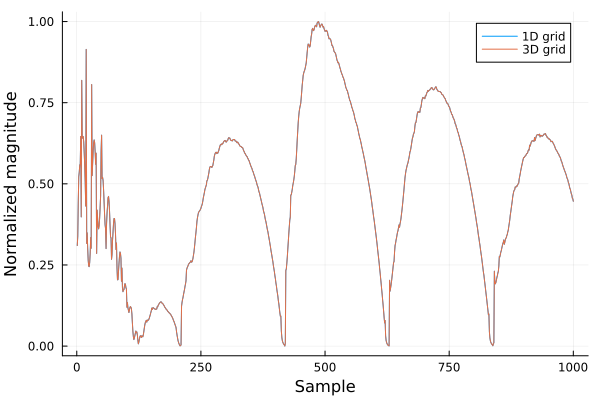

In [3]:
# 1D REGULAR AND 3D REGULAR PRODUCE IDENTICAL SIGNAL EVOLUTION 

x_pos = collect(range(-5e-3, 5e-3, length=101))
obj = Phantom{Float64}(
    x = x_pos,
    y = zeros(length(x_pos)),
    z = zeros(length(x_pos)),
    T1 = fill(T1, length(x_pos)),
    T2 = fill(T2, length(x_pos))
)

sig = nothing
@suppress sig = simulate(obj, seq1, sys; sim_params=sim_params)
sig_clean = dropdims(sig, dims=4)
sig_channel = sig_clean[:, :, 1]
signal_mag1 = vec(sum(sig_channel, dims=2))


# 3D REGULAR PHANTOM

y_pos3d = collect(range(-1e-3, 1e-3, length=5))
z_pos3d = collect(range(-1e-3, 1e-3, length=5))

XYZ_10 = [ (x, y, z) for x in x_pos, y in y_pos3d, z in z_pos3d ]
XYZ_10 = vec(XYZ_10) 

xs = [p[1] for p in XYZ_10]
ys = [p[2] for p in XYZ_10]
zs = [p[3] for p in XYZ_10]

T1s = fill(T1, length(XYZ_10))
T2s = fill(T2, length(XYZ_10))

obj_3d_10 = Phantom{Float64}(
    x = xs,
    y = ys,
    z = zs,
    T1 = T1s,
    T2 = T2s
)

sig = nothing
@suppress sig = simulate(obj_3d_10, seq1, sys; sim_params=sim_params)
sig_clean = dropdims(sig, dims=4)
sig_channel = sig_clean[:, :, 1]
signal_mag3 = vec(sum(sig_channel, dims=2))

p1 = abs.(signal_mag1) ./ maximum(abs.(signal_mag1))
p3 = abs.(signal_mag3) ./ maximum(abs.(signal_mag3))

plot(p1, label="1D grid", xlabel="Sample", ylabel="Normalized magnitude")
plot!(p3, label="3D grid")


("MAE" => 6.6210106f-7, "RMSE" => 9.1659734f-7, "Max|Δ|" => 4.082918f-6)


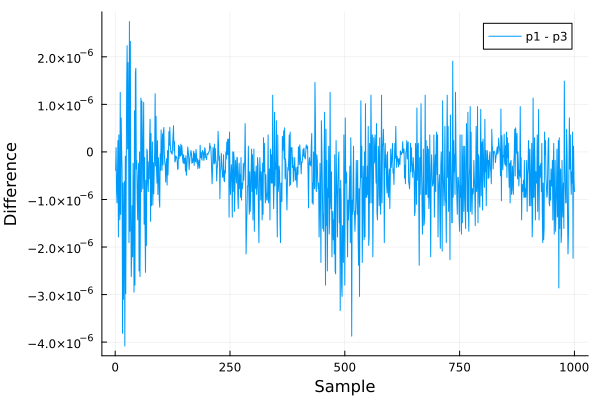

In [ ]:
Δ = p1 .- p3                
Δabs = abs.(Δ)                
mae   = mean(Δabs)            
rmse  = sqrt(mean(abs2, Δ))   
maxd  = maximum(Δabs)       

println(("MAE" => mae, "RMSE" => rmse, "Max|Δ|" => maxd))

plot(Δ, label="p1 - p3", xlabel="Sample", ylabel="Difference")

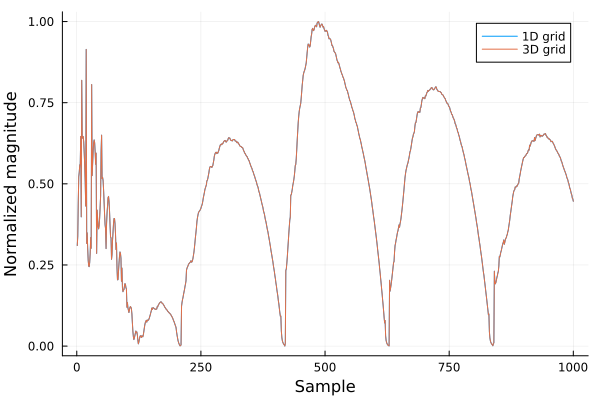

In [5]:
# UNEVEN 1D REGULAR AND 3D REGULAR PRODUCE IDENTICAL SIGNAL EVOLUTION (ISH)

x_pos = collect(range(-5e-3, 5e-3, length=101))
obj = Phantom{Float64}(
    x = x_pos,
    y = zeros(length(x_pos)),
    z = zeros(length(x_pos)),
    T1 = fill(T1, length(x_pos)),
    T2 = fill(T2, length(x_pos))
)

sig = nothing
@suppress sig = simulate(obj, seq1, sys; sim_params=sim_params)
sig_clean = dropdims(sig, dims=4)
sig_channel = sig_clean[:, :, 1]
signal_mag1 = vec(sum(sig_channel, dims=2))


# 3D REGULAR PHANTOM

y_pos3d = collect(range(0, 1e-3, length=5))
z_pos3d = collect(range(0, 1e-3, length=5))

XYZ_10 = [ (x, y, z) for x in x_pos, y in y_pos3d, z in z_pos3d ]
XYZ_10 = vec(XYZ_10) 

xs = [p[1] for p in XYZ_10]
ys = [p[2] for p in XYZ_10]
zs = [p[3] for p in XYZ_10]

T1s = fill(T1, length(XYZ_10))
T2s = fill(T2, length(XYZ_10))

obj_3d_10 = Phantom{Float64}(
    x = xs,
    y = ys,
    z = zs,
    T1 = T1s,
    T2 = T2s
)

sig = nothing
@suppress sig = simulate(obj_3d_10, seq1, sys; sim_params=sim_params)
sig_clean = dropdims(sig, dims=4)
sig_channel = sig_clean[:, :, 1]
signal_mag3 = vec(sum(sig_channel, dims=2))

p1 = abs.(signal_mag1) ./ maximum(abs.(signal_mag1))
p3 = abs.(signal_mag3) ./ maximum(abs.(signal_mag3))

plot(p1, label="1D grid", xlabel="Sample", ylabel="Normalized magnitude")
plot!(p3, label="3D grid")

("MAE" => 2.7301849f-6, "RMSE" => 1.4946901f-5, "Max|Δ|" => 0.00029036403f0)


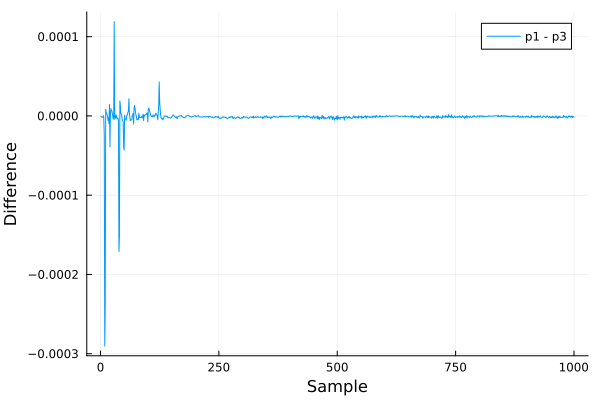

In [7]:
Δ = p1 .- p3               
Δabs = abs.(Δ)                
mae   = mean(Δabs)            
rmse  = sqrt(mean(abs2, Δ))   
maxd  = maximum(Δabs)       

println(("MAE" => mae, "RMSE" => rmse, "Max|Δ|" => maxd))

plot(Δ, label="p1 - p3", xlabel="Sample", ylabel="Difference")

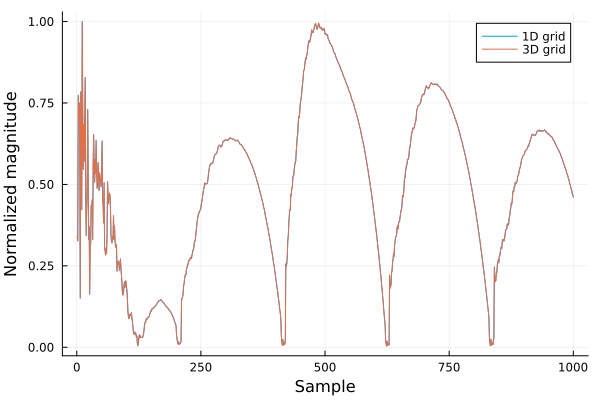

In [8]:
# RANDOM X POINTS, REGULAR Y AND Z      - IDENTICAL

n_points = 101
x_uniform = collect(range(-5e-3, 5e-3, length=n_points))
perturbation = 5e-5
x_pos3d_10 = x_uniform .+ rand(Float64, n_points) .* 2 .* perturbation .- perturbation


# 1D

obj = Phantom{Float64}(
    x = x_pos3d_10,
    y = zeros(length(x_pos)),
    z = zeros(length(x_pos)),
    T1 = fill(T1, length(x_pos)),
    T2 = fill(T2, length(x_pos))
)

sig = nothing
@suppress sig = simulate(obj, seq1, sys; sim_params=sim_params)

sig_clean = dropdims(sig, dims=4)
sig_channel = sig_clean[:, :, 1]
signal_mag1 = vec(sum(sig_channel, dims=2))

y_pos3d_10 = collect(range(-1e-3, 1e-3, length=5))
z_pos3d_10 = collect(range(-1e-3, 1e-3, length=5))

XYZ_10 = [ (x, y, z) for x in x_pos3d_10, y in y_pos3d_10, z in z_pos3d_10 ]
XYZ_10 = vec(XYZ_10) 

xs = [p[1] for p in XYZ_10]
ys = [p[2] for p in XYZ_10]
zs = [p[3] for p in XYZ_10]

T1s = fill(T1, length(XYZ_10))
T2s = fill(T2, length(XYZ_10))

obj_3d = Phantom{Float64}(
    x = xs,
    y = ys,
    z = zs,
    T1 = T1s,
    T2 = T2s
)

sig = nothing
@suppress sig = simulate(obj_3d, seq1, sys; sim_params=sim_params)

sig_clean = dropdims(sig, dims=4)
sig_channel = sig_clean[:, :, 1]
signal_mag3 = vec(sum(sig_channel, dims=2))


p1 = abs.(signal_mag1) ./ maximum(abs.(signal_mag1))
p3 = abs.(signal_mag3) ./ maximum(abs.(signal_mag3))

plot(p1, label="1D grid", xlabel="Sample", ylabel="Normalized magnitude")
plot!(p3, label="3D grid")

("MAE" => 5.375915f-7, "RMSE" => 7.497247f-7, "Max|Δ|" => 3.6358833f-6)


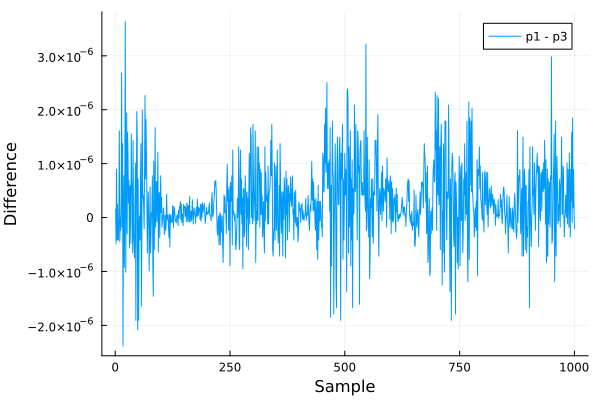

In [10]:
Δ = p1 .- p3            
Δabs = abs.(Δ)                
mae   = mean(Δabs)            
rmse  = sqrt(mean(abs2, Δ))   
maxd  = maximum(Δabs)       

println(("MAE" => mae, "RMSE" => rmse, "Max|Δ|" => maxd))

plot(Δ, label="p1 - p3", xlabel="Sample", ylabel="Difference")

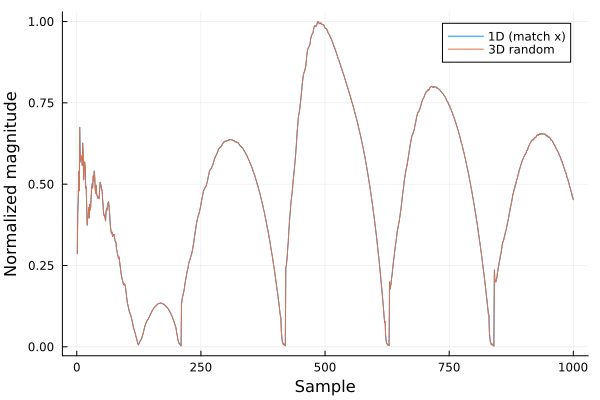

In [11]:
Random.seed!(1234)

n_x, n_y, n_z = 101, 5, 5
x_uniform = collect(range(-5e-3, 5e-3, length=n_x))
y_uniform = collect(range(-1e-3, 1e-3, length=n_y))
z_uniform = collect(range(-1e-3, 1e-3, length=n_z))
N = length(x_uniform) * length(y_uniform) * length(z_uniform)

xmin, xmax = extrema(x_uniform)
ymin, ymax = extrema(y_uniform)
zmin, zmax = extrema(z_uniform)

xs = xmin .+ (xmax - xmin) .* rand(N)
ys = ymin .+ (ymax - ymin) .* rand(N)
zs = zmin .+ (zmax - zmin) .* rand(N)

obj_3d = Phantom{Float64}(
    x = xs, y = ys, z = zs,
    T1 = fill(T1, N), T2 = fill(T2, N)
)

obj_1d = Phantom{Float64}(
    x = xs, y = zeros(N), z = zeros(N),
    T1 = fill(T1, N), T2 = fill(T2, N)
)

sig1 = nothing
@suppress sig1 = simulate(obj_1d, seq1, sys; sim_params=sim_params)

sig3 = nothing
@suppress sig3 = simulate(obj_3d, seq1, sys; sim_params=sim_params)

sig_clean1 = dropdims(sig1, dims=4)
sig_channel1 = sig_clean1[:, :, 1]
signal_mag1 = vec(sum(sig_channel1, dims=2))

sig_clean3 = dropdims(sig3, dims=4)
sig_channel3 = sig_clean3[:, :, 1]
signal_mag3 = vec(sum(sig_channel3, dims=2))

p1 = abs.(signal_mag1) ./ maximum(abs.(signal_mag1))
p3 = abs.(signal_mag3) ./ maximum(abs.(signal_mag3))

plot(p1, label="1D (match x)", xlabel="Sample", ylabel="Normalized magnitude")
plot!(p3, label="3D random")


24553

24800

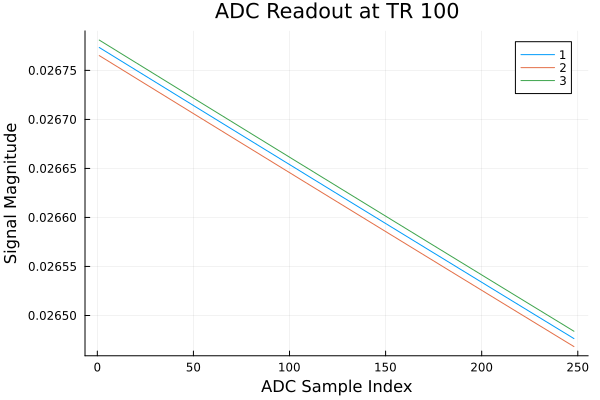

In [ ]:
# 1D phantoms at different z positions

obj1 = Phantom{Float64}(
    x = [0.0],
    y = [0.0],
    z = [0.0],
    T1 = [T1],
    T2 = [T2]
)
obj2 = Phantom{Float64}(
    x = [0.0],
    y = [0.0],
    z = [1.0e-3],
    T1 = [T1],
    T2 = [T2]
)
obj3 = Phantom{Float64}(
    x = [0.0],
    y = [0.0],
    z = [-1.0e-3],
    T1 = [T1],
    T2 = [T2]
)

sig1 = nothing
@suppress sig1 = simulate(obj1, seq248, sys; sim_params=sim_params)

sig2 = nothing
@suppress sig2 = simulate(obj2, seq248, sys; sim_params=sim_params)

sig3 = nothing
@suppress sig3 = simulate(obj3, seq248, sys; sim_params=sim_params)


sig_clean1 = dropdims(sig1, dims=4)
sig_clean2 = dropdims(sig2, dims=4)
sig_clean3 = dropdims(sig3, dims=4)
sig_channel1 = sig_clean1[:, :, 1]
sig_channel2 = sig_clean2[:, :, 1]
sig_channel3 = sig_clean3[:, :, 1]
signal_mag1 = dropdims(sig_channel1, dims=2) 
signal_mag2 = dropdims(sig_channel2, dims=2) 
signal_mag3 = dropdims(sig_channel3, dims=2) 


adc_len = 248
tr_index = 100

adc_start = (tr_index - 1) * adc_len + 1
adc_end   = tr_index * adc_len

display(adc_start)
display(adc_end)

adc_trace1 = signal_mag1[adc_start:adc_end]
adc_trace2 = signal_mag2[adc_start:adc_end]
adc_trace3 = signal_mag3[adc_start:adc_end]

plot(abs.(adc_trace1), label = "1", xlabel = "ADC Sample Index", ylabel = "Signal Magnitude",
     title = "ADC Readout at TR $tr_index")
plot!(abs.(adc_trace2), label = "2")
plot!(abs.(adc_trace3), label = "3")

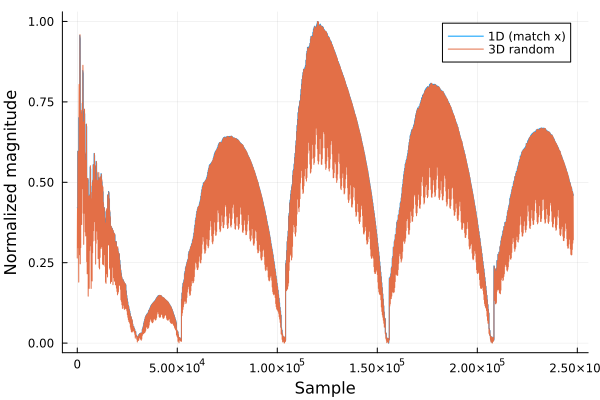

In [13]:
Random.seed!(1234)

n_x, n_y, n_z = 51, 3, 3
x_uniform = collect(range(-5e-3, 5e-3, length=n_x))
y_uniform = collect(range(-1e-3, 1e-3, length=n_y))
z_uniform = collect(range(-1e-3, 1e-3, length=n_z))
N = length(x_uniform) * length(y_uniform) * length(z_uniform)

xmin, xmax = extrema(x_uniform)
ymin, ymax = extrema(y_uniform)
zmin, zmax = extrema(z_uniform)

xs = xmin .+ (xmax - xmin) .* rand(N)
ys = ymin .+ (ymax - ymin) .* rand(N)
zs = zmin .+ (zmax - zmin) .* rand(N)

obj_3d = Phantom{Float64}(
    x = xs, y = ys, z = zs,
    T1 = fill(T1, N), T2 = fill(T2, N)
)

obj_1d = Phantom{Float64}(
    x = xs, y = zeros(N), z = zeros(N),
    T1 = fill(T1, N), T2 = fill(T2, N)
)

sig1 = nothing
@suppress sig1 = simulate(obj_1d, seq248, sys; sim_params=sim_params)

sig3 = nothing
@suppress sig3 = simulate(obj_3d, seq248, sys; sim_params=sim_params)

sig_clean1 = dropdims(sig1, dims=4)
sig_channel1 = sig_clean1[:, :, 1]
signal_mag1 = vec(sum(sig_channel1, dims=2))

sig_clean3 = dropdims(sig3, dims=4)
sig_channel3 = sig_clean3[:, :, 1]
signal_mag3 = vec(sum(sig_channel3, dims=2))

p1 = abs.(signal_mag1) ./ maximum(abs.(signal_mag1))
p3 = abs.(signal_mag3) ./ maximum(abs.(signal_mag3))

plot(p1, label="1D (match x)", xlabel="Sample", ylabel="Normalized magnitude")
plot!(p3, label="3D random")

24553

24800

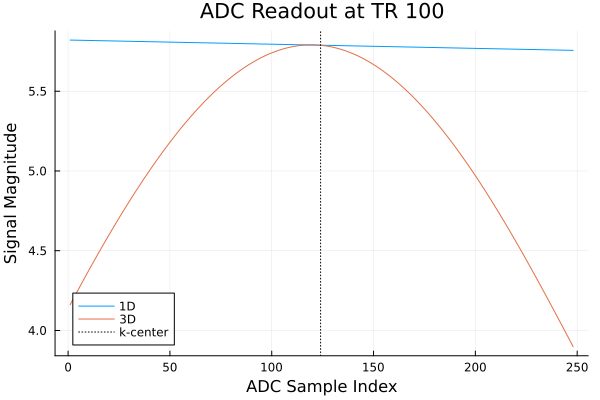

In [14]:
adc_len = 248
tr_index = 100

adc_start = (tr_index - 1) * adc_len + 1
adc_end   = tr_index * adc_len

display(adc_start)
display(adc_end)

adc_trace1 = signal_mag1[adc_start:adc_end]
adc_trace3 = signal_mag3[adc_start:adc_end]

plot(abs.(adc_trace1), label = "1D", xlabel = "ADC Sample Index", ylabel = "Signal Magnitude",
     title = "ADC Readout at TR $tr_index")
plot!(abs.(adc_trace3), label = "3D")
vline!([124], linestyle=:dot, color=:black, label="k-center")